In [28]:
## Import Statements
import xarray
import numpy as np
import pyart
import metpy.calc as metcalc
from metpy.units import units
import proplot as pplt

import math
import matplotlib.pyplot as pl
import matplotlib.colors as mcolors
import matplotlib.patches as mpatches
from PIL import Image

import os, glob
import wildfire2 as wf2

import datetime
from netCDF4 import Dataset as ncDataset
import cartopy.crs as ccrs
import pyproj
import rasterio.crs
from rasterio import Affine
from rasterio.warp import reproject, Resampling
from rasterio.mask import mask

import shapely
from shapely import geometry
from matplotlib import cm
import fiona
import imageio

import satpy.modifiers.parallax as smp

from cartopy_map_utils import proj4_to_cartopy
import model as md

import matplotlib.pyplot as plt
import matplotlib.image as mpimg

In [2]:
## This method gets the satellite data for a particular channel.
## It then returns the data for the channel in question and the resolution.
def getSatelliteData(year, month, day, time, channel):
    path_sat = f'/g/data/ra22/satellite-products/arc/obs/himawari-ahi/fldk/latest/{year}/{month}/{day}/{time}/'
    if (channel == 'f1'):
        ## Visible Channels
        data = np.squeeze(xarray.open_dataset(path_sat + f'{year}{month}{day}{time}00-P1S-ABOM_OBS_B01-PRJ_GEOS141_1000-HIMAWARI8-AHI.nc'))
        resolution = 1000
        return (data, resolution)
    elif (channel == 'f2'):
        ## Part of Visible Channels
        data = np.squeeze(xarray.open_dataset(path_sat + f'{year}{month}{day}{time}00-P1S-ABOM_OBS_B02-PRJ_GEOS141_1000-HIMAWARI8-AHI.nc'))
        resolution = 1000
        return (data, resolution)
    elif (channel == 'f3'):
        ## Part of Visible Channels
        data = np.squeeze(xarray.open_dataset(path_sat + f'{year}{month}{day}{time}00-P1S-ABOM_OBS_B03-PRJ_GEOS141_500-HIMAWARI8-AHI.nc'))
        resolution = 500
        return (data, resolution)
    elif (channel == 'f7'):
        ## Brightness Temperature 4µm channel 
        data = np.squeeze(xarray.open_dataset(path_sat + f'{year}{month}{day}{time}00-P1S-ABOM_OBS_B07-PRJ_GEOS141_2000-HIMAWARI8-AHI.nc'))
        resolution = 2000
        return (data, resolution)
    elif (channel == 'f14'):
        ## Brightness Temperature 11µm channel
        data = np.squeeze(xarray.open_dataset(path_sat + f'{year}{month}{day}{time}00-P1S-ABOM_OBS_B14-PRJ_GEOS141_2000-HIMAWARI8-AHI.nc'))
        resolution = 2000
        return (data, resolution)
    elif (channel == 'f16'):
        ## Brightness Temperature 13µm channel
        data = np.squeeze(xarray.open_dataset(path_sat + f'{year}{month}{day}{time}00-P1S-ABOM_OBS_B16-PRJ_GEOS141_2000-HIMAWARI8-AHI.nc'))
        resolution = 2000
        return (data, resolution)
    elif (channel == 'f4'):
        data = np.squeeze(xarray.open_dataset(path_sat + f'{year}{month}{day}{time}00-P1S-ABOM_OBS_B04-PRJ_GEOS141_1000-HIMAWARI8-AHI.nc'))
        resolution = 1000
        return (data, resolution)
    elif (channel == 'f5'):
        data = np.squeeze(xarray.open_dataset(path_sat + f'{year}{month}{day}{time}00-P1S-ABOM_OBS_B05-PRJ_GEOS141_2000-HIMAWARI8-AHI.nc'))
        resolution = 2000
        return (data, resolution)
    elif (channel == 'f6'):
        data = np.squeeze(xarray.open_dataset(path_sat + f'{year}{month}{day}{time}00-P1S-ABOM_OBS_B06-PRJ_GEOS141_2000-HIMAWARI8-AHI.nc'))
        resolution = 2000
        return (data, resolution)
    elif (channel == 'f13'):
        data = np.squeeze(xarray.open_dataset(path_sat + f'{year}{month}{day}{time}00-P1S-ABOM_OBS_B13-PRJ_GEOS141_2000-HIMAWARI8-AHI.nc'))
        resolution = 2000
        return (data, resolution)
    elif (channel == 'fr1'):
        data = np.squeeze(xarray.open_dataset(path_sat + f'{year}{month}{day}{time}00-P1S-ABOM_CREFL_B01-PRJ_GEOS141_1000-HIMAWARI8-AHI.nc'))
        resolution = 1000
        return (data, resolution)
    elif (channel == 'fr2'):
        data = np.squeeze(xarray.open_dataset(path_sat + f'{year}{month}{day}{time}00-P1S-ABOM_CREFL_B02-PRJ_GEOS141_1000-HIMAWARI8-AHI.nc'))
        resolution = 1000
        return (data, resolution)
    elif (channel == 'fr3'):
        data = np.squeeze(xarray.open_dataset(path_sat + f'{year}{month}{day}{time}00-P1S-ABOM_CREFL_B03-PRJ_GEOS141_500-HIMAWARI8-AHI.nc'))
        resolution = 500
        return (data, resolution)
    elif (channel == 'fr4'):
        data = np.squeeze(xarray.open_dataset(path_sat + f'{year}{month}{day}{time}00-P1S-ABOM_CREFL_B04-PRJ_GEOS141_1000-HIMAWARI8-AHI.nc'))
        resolution = 1000
        return (data, resolution)
    elif (channel == 'fr5'):
        data = np.squeeze(xarray.open_dataset(path_sat + f'{year}{month}{day}{time}00-P1S-ABOM_CREFL_B05-PRJ_GEOS141_2000-HIMAWARI8-AHI.nc'))
        resolution = 2000
        return (data, resolution)
    elif (channel == 'fr6'):
        data = np.squeeze(xarray.open_dataset(path_sat + f'{year}{month}{day}{time}00-P1S-ABOM_CREFL_B06-PRJ_GEOS141_2000-HIMAWARI8-AHI.nc'))
        resolution = 2000
        return (data, resolution)
    elif (channel == 'f_sza'):
        data = np.squeeze(xarray.open_dataset(path_sat + f'{year}{month}{day}{time}00-P1S-ABOM_GEOM_SOLAR-PRJ_GEOS141_2000-HIMAWARI8-AHI.nc'))
        resolution = 2000
        return (data, resolution)
    elif (channel == 'ctth'):
        path_para = f'/g/data/rv74/satellite-products/arc/der/himawari-ahi/cloud/ctth/{year}/{month}/{day}/'
        f_para = path_para + f'S_NWC_CTTH_HIMA08_HIMA-N-NR_{year}{month}{day}T{time}00Z.nc'
        data = xarray.open_dataset(f_para)
        return (data, np.nan)

In [3]:
## This method gets the configuration data for the Himawari satellite (mostly for lat/lon purposes)
## It returns this data in netcdf4 and xarray formats!
def getConfig():
    path_conf = '/g/data/kl02/jv1871/data/Himawari/'
    ## There are three different resolutions: 500m, 1000m, 2000m, each with their own set of different configurations.
    resolutions = [500, 1000, 2000]
    geom_sensor_dico_netcdf4 = []
    geom_sensor_dico_xarray = []
    ## This loop will get the data corresponding to the resolutions independently, and hence needs to be executed for the three different resolutions.
    for r in resolutions :
        geom_sensor_dico_netcdf4.append(ncDataset(path_conf + f'00000000000000-P1S-ABOM_GEOM_SENSOR-PRJ_GEOS141_{r}-HIMAWARI8-AHI.nc', mode='a'))
        geom_sensor_dico_xarray.append(xarray.open_dataset(path_conf + f'00000000000000-P1S-ABOM_GEOM_SENSOR-PRJ_GEOS141_{r}-HIMAWARI8-AHI.nc'))
    return (geom_sensor_dico_netcdf4, geom_sensor_dico_xarray)

In [4]:
## This method, an outdated older version, returns the three visible channels stacked on top of each other to create a visible image. The only inputs are the desired day and time that data is requested.
def OldGetVisible(year, month, day, time):

    ## Calls getSatellite Method to get the corresponding satellite data
    f1 = getSatelliteData(year, month, day, time, "f1")[0]
    f2 = getSatelliteData(year, month, day, time, "f2")[0]
    f3 = getSatelliteData(year, month, day, time, "f3")[0]

    b1 = f1['channel_0001_scaled_radiance'].values
    b2 = f2['channel_0002_scaled_radiance'].values
    b3 = f3['channel_0003_scaled_radiance'].values

    ## We need to get a lower resolution for f3 to match that of f2 (i.e. turning a 500m resolution into a 1000m)
    new_b3 = downGrid(b3, b3.shape[0], b2.shape[0])

    print(b1.shape)
    print(b2.shape)
    print(b3.shape)

    vmin = 0
    vmax = .5
    ## Assigns the channel a value between 0 and 255
    B1 = b1.clip(vmin, vmax) / vmax * 255
    B2 = b2.clip(vmin, vmax) / vmax * 255
    B3 = new_b3.clip(vmin, vmax) / vmax * 255

    ## Stacks the channels on top of each other, required for visible imagery.
    rgb = np.stack((B3, B2, B1), axis=2).astype('uint8')
    return rgb

In [5]:
## This method takes the visible imagery from three separate channels and combines them to make one visible image.
def getVisible(f1, f2, f3):
    vmin = 0
    vmax = .5

    ## Assigns the channel a value between 0 and 255.
    B1 = f1.clip(vmin, vmax) / vmax * 255
    B2 = f2.clip(vmin, vmax) / vmax * 255
    B3 = f3.clip(vmin, vmax) / vmax * 255

    ## Stacks the channels on top of each other required for visible imagery.
    rgb = np.stack((B3, B2, B1), axis=2).astype('uint8')
    return rgb

In [6]:
## This method will return a low-resolution image of only a certain specified area. The only specifications are the date, time and location of the specified image.
def getCroppedVisible(year, month, day, time, minLat, maxLat, minLon, maxLon):

    ## Retrieves the satellite data.
    f1 = getSatelliteData(year, month, day, time, 'f1')[0]
    f2 = getSatelliteData(year, month, day, time, 'f2')[0]
    f3 = getSatelliteData(year, month, day, time, 'f3')[0]

    b1 = f1["channel_0001_scaled_radiance"].values
    b1x = f1['x'].values
    b1y = f1['y'].values
    b2 = f2["channel_0002_scaled_radiance"].values
    b2x = f2['x'].values
    b2y = f2['y'].values
    b3 = f3['channel_0003_scaled_radiance'].values
    b3x = f3['x'].values
    b3y = f3['y'].values
    
    ## Downgrids the data into a lower resolution. For f1 and f2, this is turning a 1000m resolution into a 2000m resolution, and for f3 this is turning a 500m resolution into a 2000m resolution.
    down_b1 = downGrid(b1, b1.shape[0], 5500)
    down_b2 = downGrid(b2, b2.shape[0], 5500)
    down_b3 = downGrid(b3, b3.shape[0], 5500)
    
    ## This downgrids the x and y values of the associated data as well, so that it can match that associated with the DownGrid data.
    b1xn, b1yn = downGridXY(b1x, b1y, len(b1x), 5500)
    b2xn, b2yn = downGridXY(b2x, b2y, len(b2x), 5500)
    b3xn, b3yn = downGridXY(b3x, b3y, len(b3x), 5500)
    
    ## This filters the data by the specified coordinates, creating a much smaller, zoomed in image. 
    filter_f1, new_b1x, new_b1y = newFilterData(down_b1, minLat, maxLat, minLon, maxLon, b1xn, b1yn)
    filter_f2, new_b2x, new_b2y = newFilterData(down_b2, minLat, maxLat, minLon, maxLon, b2xn, b2yn)
    filter_f3, new_b3x, new_b3y = newFilterData(down_b3, minLat, maxLat, minLon, maxLon, b3xn, b3yn)

    ## This applies the parallax correction on the associated channels - See the methods for more specific information.
    shifted_f1 = get_shifted_array(filter_f1, minLat, maxLat, minLon, maxLon, year, month, day, time)
    shifted_f2 = get_shifted_array(filter_f2, minLat, maxLat, minLon, maxLon, year, month, day, time)
    shifted_f3 = get_shifted_array(filter_f3, minLat, maxLat, minLon, maxLon, year, month, day, time)

    ## This interpolates any pixels without data with data from nearby cells. Pixels without data are caused as a result of the parallax correction being performed.
    interpolated_f1 = interpolate(shifted_f1)
    interpolated_f2 = interpolate(shifted_f2)
    interpolated_f3 = interpolate(shifted_f3)

    ## Combines the three channels into one for the final image display. 
    rgb = getVisible(interpolated_f1, interpolated_f2, interpolated_f3)

    return (rgb, new_b1x, new_b1y)

In [7]:
## This method will provide a high-resolution satellite image for a specified area. This takes in the date and time, and the specified coordinates and returns a high-resolution visible image of an area.
def getHighResCroppedVisible(year, month, day, time, minLat, maxLat, minLon, maxLon):
    ## Gets the data from the three visible channels
    f1 = getSatelliteData(year, month, day, time, 'f1')[0]
    f2 = getSatelliteData(year, month, day, time, 'f2')[0]
    f3 = getSatelliteData(year, month, day, time, 'f3')[0]

    b1 = f1["channel_0001_scaled_radiance"].values
    b1x = f1['x'].values
    b1y = f1['y'].values
    b2 = f2["channel_0002_scaled_radiance"].values
    b2x = f2['x'].values
    b2y = f2['y'].values
    b3 = f3['channel_0003_scaled_radiance'].values
    b3x = f3['x'].values
    b3y = f3['y'].values

    ## Need to change the resolution from channels 1 and 2 from 1000m to 500m, thereby doubling the amount of data entries.
    up_b1 = newUpGrid(b1, b1.shape[0], 22000)
    up_b2 = newUpGrid(b2, b2.shape[0], 22000)
    
    ## In addition to updating the data itself, the x and y values need to be updated by doubling the amount of entries in the array.
    b1xn, b1yn = upGridXY(b1x, b1y, len(b1x), 22000)
    b2xn, b2yn = upGridXY(b2x, b2y, len(b2x), 22000)


    ## It is unfortunately necessary to leave off the last row for filter_f1 and f2! - This is due to algorithm errors.
    ## Filters the data so only the specifieid coordinates appear inthe image.
    filter_f1, new_b1x, new_b1y = newFilterData(up_b1, minLat, maxLat, minLon, maxLon, b1xn, b1yn)
    filter_f2, new_b2x, new_b2y = newFilterData(up_b2, minLat, maxLat, minLon, maxLon, b2xn, b2yn)
    filter_f3, new_b3x, new_b3y = newFilterData(b3, minLat, maxLat, minLon, maxLon, b3x, b3y)

    ## Performs the parallax correction on the image - See the method for more detailed information on why this is needed.
    shifted_f1 = get_HighRes_shifted_array(filter_f1, minLat, maxLat, minLon, maxLon, year, month, day, time)
    shifted_f2 = get_HighRes_shifted_array(filter_f2, minLat, maxLat, minLon, maxLon, year, month, day, time)
    shifted_f3 = get_HighRes_shifted_array(filter_f3, minLat, maxLat, minLon, maxLon, year, month, day, time)

    ## Interpolates any missing pixels that are in the image by finding values from surrounding pixels. Pixels may be missing values as a result of parallax correction.
    interpolated_f1 = interpolate(shifted_f1)
    interpolated_f2 = interpolate(shifted_f2)
    interpolated_f3 = interpolate(shifted_f3)

    ## Combines the three interpolated channels into one array, the final array necessary for the image.
    rgb = getVisible(interpolated_f1, interpolated_f2, interpolated_f3)
    return (rgb, new_b1x, new_b1y)

In [8]:
## This method will take an array of a certain size (originalSize) and make it smaller (newSize)
## IMPORTANT NOTE - This method only works with square arrays 
def downGrid(data, originalSize, newSize):
    ## Calculates by what factor the array needs to be decreased by (for example, 2, 4)
    conversion_factor = int((originalSize/newSize))
    newArray = np.zeros((newSize, newSize))
    ## This will loop through every element within the newArray, manually filling every element with a corresponding element from the old array.
    for i in range(newArray.shape[0]):
        for j in range(newArray.shape[0]):
            ## In case the array tries to access an element that is outside the bounds of the newArray, the data from the last row/column applicable in the data array is read.
            if (i >= newSize and j >= newSize):
                newArray[i][j] = data[-1][-1]
            elif (i >= newSize):
                newArray[i][j] = data[-1][j*conversion_factor]
            elif (j >= (newSize-1)):
                newArray[i][j] = data[i*conversion_factor][-1]
            else:
                ## Conversion-factor is applied as only every 2nd or 4th data value needs to be read into the new array.
                newArray[i][j] = data[i*conversion_factor][j*conversion_factor]
    return newArray

In [1]:
## This method will take a certain x and y array and downsize it, thereby making it smaller.
def downGridXY(old_x, old_y, originalSize, newSize):
    ## Calculates by what factor the array is being decreased by.
    conversion_factor = int((originalSize/newSize))
    newX = np.zeros(newSize)
    newY = np.zeros(newSize)
    ## Manually adds every element from the old data array itno the newArray.
    for i in range(len(newX)):
        ## In this case, conversion_factor acts as a way to only read every 2nd or 4th dataset (depending on the exact value of conversion_factor). Data from every element does not need to be read.
        newX[i] = old_x[i*conversion_factor]
        newY[i] = old_y[i*conversion_factor]
    return newX, newY

In [10]:
## This is a new upGird method that will take an array of a certain size (originalSize) and make it larger (newSize).
## This new method should have a O(n) runnign time, beating the previous O(n^2) running time.
def newUpGrid(data, originalSize, newSize):
    ## Calculates by what factor the newArray needs to be larger by.
    conversion_factor = int((newSize/originalSize))
    ## For the first step, only the columns will be made larger. The rows will be left intact.
    step1 = np.zeros((newSize, originalSize))
    i_counter = 0
    ## Manually adjusts the columns of newArray with data from the previous old array.
    ## i_counter acts as a way to determine which particular row from newArray gets copied.
    for i in range(newSize):
        ## Only every conversion_factor time (i.e. 2nd or 4th time) does the i_counter need to be updated. For all other times, it is simply re-reading the data from the previous row.
        if (i % conversion_factor == 0):
            i_counter += 1
        step1[i,:] = data[i_counter-1, :]
    ## For the second (and final) step, the new rows will be made for the larger array, thereby completing the upsizing.
    final = np.zeros((newSize, newSize))
    i_counter = 0
    ## Manually
    for i in range(newSize):
        ## Only every conversion_factor time (i.e. 2nd or 4th time) does the i_counter need to be updated. For all other times, it is simply re-reading the data from the previous row.
        if (i % conversion_factor == 0):
            i_counter += 1
        final[:,i] = step1[:, i_counter-1]
        
    return final

In [11]:
## This is a method to scale up the x and y values of an array from originalSize to a bigger newSize.
def upGridXY(old_x, old_y, originalSize, newSize):
    ## Conversion factor determines the factor that the new array is being changed by.
    conversion_factor = int((newSize/originalSize))
    newX = np.zeros(newSize)
    newY = np.zeros(newSize)
    counter = 0
    ## Goes through the newArray and manually adds each element into the new data array.
    for i in range(newSize):
        newX[i] = old_x[counter-1]
        newY[i] = old_y[counter-1]
        ## Only on every conversion_factorith iteration (i.e. 2nd, 4th) does the counter need to be updated. For all other times, it simply rereads the data from the last run.
        if (i % conversion_factor == 0):
            counter += 1
    finalX = np.zeros(newSize)
    finalY = np.zeros(newSize)

    ## As a result of my incompetence (and it's a very easy fix in the above code), the first element should be in the last position in the array. The below process works to make this happen in each of the Y and X arrays.
    finalX[0:-1] = newX[1:]
    finalX[-1] = newX[0]

    finalY[0:-1] = newY[1:]
    finalX[-1] = newX[0]
    return finalX, finalY

In [12]:
## This is a new method to filter the data based on desired latitude and longitude coordinates. The only inputs are the coordinates, x, and y values of the array.
def newFilterData(data, minLat, maxLat, minLon, maxLon, x, y):
    ## This will get the solar zenith angle data for the array. This channel is commonly used for projection information.
    f_sza = getSatelliteData(year, month, day, time, 'f_sza')[0]
    ## Convert to a pyproj object.
    fsza_proj4string = f_sza.geostationary.proj4
    p = pyproj.Proj(fsza_proj4string)
    
    ## Find the x and y values associated with the two opposite corners of the image.
    x1, y2 = p(minLon, minLat)
    x2, y1 = p(maxLon, maxLat)
    ## Finds the position that is closest to the x and y values calculated above.
    x1Index = (np.abs(x - x1)).argmin()
    x2Index = (np.abs(x - x2)).argmin()
    y1Index = (np.abs(y - y1)).argmin()
    y2Index = (np.abs(y - y2)).argmin()

    ##Throughout the dataset, y comes first and then x, so it is therefore necessary to flip the output of y and x as a result of how this was programmed. 
    ## Actually perofmr 
    newData = data[y1Index:y2Index, x1Index:x2Index]
    newX = x[x1Index:x2Index]
    newY = y[y1Index:y2Index]
    return (newData, newY, newX)

In [13]:
## This method will get the x and y boundaries for the specified lat and lon given.
def getXYBoundaries(minLat, maxLat, minLon, maxLon):
    ## This will get the solar zenith angle data for the array. This channel is commonly used for projection information.
    f_sza = getSatelliteData(year, month, day, time, 'f_sza')[0]
    ## Convert to a pyproj object.
    fsza_proj4string = f_sza.geostationary.proj4
    p = pyproj.Proj(fsza_proj4string)

    ## Find the x and y values associated with the two opposite corners of the image.
    x1, y2 = p(minLon, minLat)
    x2, y1 = p(maxLon, maxLat)

    return (x1, x2, y2, y1)

In [14]:
## This method will perform parallax correction on a desired dataset. The inputs are the coordinates, date and time, as well as the dataset in question
## NOTE: This method assumes a resolution of 2000m!
def get_shifted_array(data, desiredMinLat, desiredMaxLat, desiredMinLon, desiredMaxLon, year, month, day, time):
    ## Gets satellite data associated with ctth - Cloud Top Height
    ctth = getSatelliteData(year, month, day, time, "ctth")[0]
    ctth_data = ctth['ctth_alti'].values
    ctth_x = ctth['nx'].values
    ctth_y = ctth['ny'].values

    ## Filters the new cloud top height dataset using the filter method. 
    new_ctth, new_nx, new_ny = newFilterData(ctth_data, desiredMinLat, desiredMaxLat, desiredMinLon, desiredMaxLon, 
                                          ctth_x, ctth_y)
    ## Get solar zenith angle dataset to get projection information.
    f_sza = getSatelliteData(year, month, day, time, 'f_sza')[0]
    fsza_proj4string = f_sza.geostationary.proj4
    ## Create a pyproj object to extract the longitude (center of satellite) and height of the satellite.
    b = pyproj.CRS.from_string(fsza_proj4string)
    a = b.to_dict()
    lat = a['lon_0']
    height = a['h']

    ## Calcualtes the latitude and longitude from the x and y values of the array.
    lat2d, lon2d = md.calc_lat_lon_from_proj(fsza_proj4string, new_nx, new_ny)
    ## Finds the correct latitude and longitude for each pixel within the specified array.
    corr_lon, corr_lat = smp.get_parallax_corrected_lonlats(lat, 0, height, lon2d, lat2d, new_ctth)

    ## Calculates the shift needed on each pixel.
    shift_lon = corr_lon - lon2d
    shift_lat = corr_lat - lat2d
    
    n, m = shift_lon.shape
    shift_2000 = np.empty((n, m, 2))
    shift_2000[:, :, 0] = shift_lon
    shift_2000[:, :, 1] = shift_lat
    ## Uses Louis' method to convert the shift from latitude/longitude coordinates into x/y coordinates.
    shift_m_2000 = md.get_shift_xy(shift_2000, lon2d, lat2d, corr_lon, corr_lat)

    ## Uses Louis' method to actually peform the shift.
    shifted_arr = md.get_shifted_arr(shift_2000, shift_m_2000, data, 2000)
    return shifted_arr



In [15]:
## This method will peform parallax correction on a high-resolution image. The only inputs are the dataset in question, coordinates and date/time.
def get_HighRes_shifted_array(data, minLat, maxLat, minLon, maxLon, year, month, day, time):
    ## Get data corresponding to ctth - cloud top height
    ctth = getSatelliteData(year, month, day, time, "ctth")[0]
    ctth_data = ctth['ctth_alti'].values
    ctth_x = ctth['nx'].values
    ctth_y = ctth['ny'].values
    ## The cloud top height data needs to be transformed into a higher resolution dataset. To do this, it needs to be upgrided to a resolution of 500m.
    nctth = newUpGrid(ctth_data, len(ctth_x), 22000)
    nx, ny = upGridXY(ctth_x, ctth_y, len(ctth_x), 22000)

    ## Filters the data using the desired coordinates
    new_ctth, new_nx, new_ny = newFilterData(nctth, minLat, maxLat, minLon, maxLon, 
                                          nx, ny)
    ## Gets the solar zenith angle dataset for projection information.
    f_sza = getSatelliteData(year, month, day, time, 'f_sza')[0]
    fsza_proj4string = f_sza.geostationary.proj4
    ## Create a pyproj object to extract longitude (center of satellite) and height of the satellite.
    b = pyproj.CRS.from_string(fsza_proj4string)
    a = b.to_dict()
    lat = a['lon_0']
    height = a['h']

    ## Calculates the latitude and longitue from the x and y values of the array.
    lat2d, lon2d = md.calc_lat_lon_from_proj(fsza_proj4string, new_nx, new_ny)
    ## Finds the correct latitude and longitude for each pixel within the specified array.
    corr_lon, corr_lat = smp.get_parallax_corrected_lonlats(lat, 0, height, lon2d, lat2d, new_ctth)

    ## Calculates the shift needed on each pixel.
    shift_lon = corr_lon - lon2d
    shift_lat = corr_lat - lat2d
    
    n, m = shift_lon.shape
    shift_500 = np.empty((n, m, 2))
    shift_500[:, :, 0] = shift_lon
    shift_500[:, :, 1] = shift_lat
    ## Uses Louis' method to convert the shift from latitude/longitude coordinates into x/y coordinates.
    shift_m_500 = md.get_shift_xy(shift_500, lon2d, lat2d, corr_lon, corr_lat)
    ## Uses Louis' method to actually perform the shift.
    shifted_arr = md.get_shifted_arr(shift_500, shift_m_500, data, 500)

    return shifted_arr

In [16]:
## Interpolates the data using Louis' method.
def interpolate(data):
    try :
        interpolated_data = md.interpolate_missing_pixels(data, np.isnan(data), method = 'nearest')
    except Exception as e :
        print("Here")
        interpolated_data = data

    return interpolated_data

In [17]:
def getPetersonArray(year, month, day, time, radar_fp, lcl_ds, minLat, maxLat, minLon, maxLon):
    ## Time to get Peterson Array
    ## NOTE: This method assumes a low resolution Peterson array - 2000m resolution! 
    
    ## Gets the data from channel 7 of the satellite.
    b7 = getSatelliteData(year, month, day, time, 'f7')[0]
    bt4 = b7.channel_0007_brightness_temperature
    bt4x = b7['x'].values
    bt4y = b7['y'].values
    ## Filters and peforms parallax correction on the dataset.
    filter_bt4 = newFilterData(bt4.values, minLat, maxLat, minLon, maxLon, bt4x, bt4y)[0]
    shifted_bt4 = get_shifted_array(filter_bt4, minLat, maxLat, minLon, maxLon, year, month, day, time)
    interpolate_bt4 = interpolate(shifted_bt4)
    interpolate_bt4 -= 273.15

    ## Gets data from channel 14 of the satellite.
    b14 = getSatelliteData(year, month, day, time, 'f14')[0]
    bt11 = b14['channel_0014_brightness_temperature']
    bt11x = b14['x'].values
    bt11y = b14['y'].values
    ## Filters and peforms parallax correction on the dataset.
    filter_bt11 = newFilterData(bt11.values, minLat, maxLat, minLon, maxLon, bt11x, bt11y)[0]
    shifted_bt11 = get_shifted_array(filter_bt11, minLat, maxLat, minLon, maxLon, year, month, day, time)
    interpolate_bt11 = interpolate(shifted_bt11)
    interpolate_bt11 -= 273.15

    ## Gets the data from channel 16 of the satellite.
    b16 = getSatelliteData(year, month, day, time, 'f16')[0]
    bt13 = b16['channel_0016_brightness_temperature']
    bt13x = b16['x'].values
    bt13y = b16['y'].values
    ## Filters and peforms parallax correction on the dataset.
    filter_bt13, new_bt13x, new_bt13y = newFilterData(bt13.values, minLat, maxLat, minLon, maxLon, bt13x, bt13y)
    shifted_bt13 = get_shifted_array(filter_bt13, minLat, maxLat, minLon, maxLon, year, month, day, time)
    interpolate_bt13 = interpolate(shifted_bt13)
    interpolate_bt13 -= 273.15

    ## Gets the solar zenith angle dataset
    f_sza = getSatelliteData(year, month, day, time, "f_sza")[0]
    sza = np.squeeze(f_sza['solar_zenith_angle'])
    xsza = f_sza['x'].values
    ysza = f_sza['y'].values
    proj4string_sat = f_sza.geostationary.proj4
    ## Gets the projection information for the radar passed in.
    proj4string_radar = md.get_radar_proj_info(radar_fp)[-1]

    ## Gets data from the lcl_ds dataset by using the nearest timestep to the particular one in question.
    ts = f'{year}-{month}-{day}T{hour}:00:00.000000000' # selected timestamp
    lcl_ds_ts = lcl_ds.sel(time = ts, method = 'nearest')
    ## Filters the copernicus dataset to only include the area in question.
    coper = lcl_ds_ts.sel(longitude = slice(minLon, maxLon), latitude = slice(maxLat, minLat))
    ## Gets the x and y boundaries for the dataset.
    xmin, xmax, ymin, ymax = getXYBoundaries(minLat, maxLat, minLon, maxLon)
    ## Filters the solar zenith angle dataset.
    sza_area = sza.sel(x = slice(xmin, xmax), y = slice(ymax, ymin))

    ## Calculates peterson array using Louis' built-in method.
    peterson, list_pixels4 = md.create_peterson_array(interpolate_bt4, interpolate_bt11, interpolate_bt13, coper, sza_area)
    """
    peterson_reproj, dst_bounds, dst_transform = md.reproject_image(peterson, new_bt13y, new_bt13x,
                                                                        proj4string_sat,
                                                                        proj4string_radar,
                                                                        resolution = 500)
    
    
    peterson_reproj = np.where(peterson_reproj < 0.5, 1, peterson_reproj)
    peterson_reproj = np.array(peterson_reproj, dtype = int)
    """

    return (peterson)

In [18]:
## Gets brightness temperature for a desired date/time over a desired area.
def getBT(year, month, day, time, minLat, maxLat, minLon, maxLon):
    ## Gets satellite data for channel 13.
    f13 = getSatelliteData(year, month, day, time, "f13")[0]
    b13 = f13["channel_0013_brightness_temperature"].values
    b13x = f13['x'].values
    b13y = f13['y'].values

    ## Grids the dataset up for it to be compatable with high-resolution datasets.
    high_res_b13 = newUpGrid(b13, b13.shape[0], 22000)
    b13nx, b13ny = upGridXY(b13x, b13y, len(b13x), 22000)

    ## Filters and performs parallax correction on the dataset in question.
    filter_f13, b13nx, b13ny = newFilterData(high_res_b13, minLat, maxLat, minLon, maxLon, b13nx, b13ny)
    shifted_f13 = get_HighRes_shifted_array(filter_f13, minLat, maxLat, minLon, maxLon, year, month, day, time)
    interpolate_f13 = interpolate(shifted_f13)
    return (interpolate_f13, b13nx, b13ny)

In [26]:
## NOTE: This method assumes a high-resolution dataset - 500m!!
def getUpGridPetersonArray(year, month, day, time, radar_fp, lcl_ds, minLat, maxLat, minLon, maxLon):
    ## Time to get Peterson Array
    
    ## Gets the dataset for channel 7 in the satellite.
    b7 = getSatelliteData(year, month, day, time, 'f7')[0]
    bt4 = b7.channel_0007_brightness_temperature.values
    bt4x = b7['x'].values
    bt4y = b7['y'].values
    ## Performs an upgrid on the dataset to make it compatable with high-resolution datasets.
    up_bt4 = newUpGrid(bt4, bt4.shape[0], 22000)
    bt4nx, bt4ny = upGridXY(bt4x, bt4y, len(bt4x), 22000)
    ## Filters and performs parallax correction on the dataset
    filter_bt4 = newFilterData(up_bt4, minLat, maxLat, minLon, maxLon, bt4nx, bt4ny)[0]
    shifted_bt4 = get_HighRes_shifted_array(filter_bt4, minLat, maxLat, minLon, maxLon, year, month, day, time)
    interpolate_bt4 = interpolate(shifted_bt4)
    interpolate_bt4 -= 273.15
    
    ## Gets dataset for channel 14 in the satellite.
    b14 = getSatelliteData(year, month, day, time, 'f14')[0]
    bt11 = b14['channel_0014_brightness_temperature'].values
    bt11x = b14['x'].values
    bt11y = b14['y'].values
    ## Performs an upgrid on the dataset to make it compatable with high-resolution datasets.
    up_bt11 = newUpGrid(bt11, bt11.shape[0], 22000)
    bt11nx, bt11ny = upGridXY(bt11x, bt11y, len(bt11x), 22000)
    # Filters and performs parallax correction on the dataset.
    filter_bt11 = newFilterData(up_bt11, minLat, maxLat, minLon, maxLon, bt11nx, bt11ny)[0]
    shifted_bt11 = get_HighRes_shifted_array(filter_bt11, minLat, maxLat, minLon, maxLon, year, month, day, time)
    interpolate_bt11 = interpolate(shifted_bt11)
    interpolate_bt11 -= 273.15

    ## Gets dataset for channel 16 in the satellite.
    b16 = getSatelliteData(year, month, day, time, 'f16')[0]
    bt13 = b16['channel_0016_brightness_temperature'].values
    bt13x = b16['x'].values
    bt13y = b16['y'].values
    ## Performs an upgrid on the dataset to make it compatable with high-resolution datasets.
    up_bt13 = newUpGrid(bt13, bt13.shape[0], 22000)
    bt13nx, bt13ny = upGridXY(bt13x, bt13y, len(bt13x), 22000)
    ## Filters and performs parallax correction on the dataset.
    filter_bt13, new_bt13x, new_bt13y = newFilterData(up_bt13, minLat, maxLat, minLon, maxLon, bt13nx, bt13ny)
    shifted_bt13 = get_HighRes_shifted_array(filter_bt13, minLat, maxLat, minLon, maxLon, year, month, day, time)
    interpolate_bt13 = interpolate(shifted_bt13)
    interpolate_bt13 -= 273.15

    ## Gets solar zentih angle dataset.
    f_sza = getSatelliteData(year, month, day, time, "f_sza")[0]
    sza = np.squeeze(f_sza['solar_zenith_angle'])
    xsza = f_sza['x'].values
    ysza = f_sza['y'].values
    proj4string_sat = f_sza.geostationary.proj4
    ## Gets projection information from the radar
    proj4string_radar = md.get_radar_proj_info(radar_fp)[-1]
    hour = time[:2]
    ## Gets copernicus dataset from the nearest timestep in the copernicus array.
    ts = f'{year}-{month}-{day}T{hour}:00:00.000000000' # selected timestamp
    lcl_ds_ts = lcl_ds.sel(time = ts, method = 'nearest')
    coper = lcl_ds_ts.sel(longitude = slice(minLon, maxLon), latitude = slice(maxLat, minLat))
    ## Gets the x and y boundaries of the associated coordinates.
    xmin, xmax, ymin, ymax = getXYBoundaries(minLat, maxLat, minLon, maxLon)

    ## Filters the solar zenith angle according to the x and yb boundaries found above.
    sza_area = sza.sel(x = slice(xmin, xmax), y = slice(ymax, ymin))
    print(interpolate_bt4.shape)

    ## Calculates Peterson array using Louis' method.
    peterson, list_pixels4 = md.create_peterson_array(interpolate_bt4, interpolate_bt11, interpolate_bt13, coper, sza_area)
    """
    peterson_reproj, dst_bounds, dst_transform = md.reproject_image(peterson, new_bt13y, new_bt13x,
                                                                        proj4string_sat,
                                                                        proj4string_radar,
                                                                        resolution = 500)
    
    
    peterson_reproj = np.where(peterson_reproj < 0.5, 1, peterson_reproj)
    peterson_reproj = np.array(peterson_reproj, dtype = int)
    """

    return (peterson)

In [20]:
## Gets lightning data from date/time and coordinates.
def getLightningData(year, month, day, time, minLat, maxLat, minLon, maxLon):
    import atmscitools as ast
    import netCDF4 as nc
            
        
    # Get zip filename      
    path_ltng = f'/g/data/rq0/admin/aura_rainfields/unpublished/310/{year}/ltng-dens/'
    filename_zip = path_ltng + f'310_{year}{month}{day}.ltng-dens.zip'
        
    # File to scan
        
    scan = f'310_{year}{month}{day}_{time}00.ltng-dens.nc'
        
    # Extract the file and convert it to xarray
    
    nc_ds = nc.Dataset('diskless', diskless=True,
                        memory = ast.extract_item_from_zip_to_memory(filename_zip, scan))
    ds = xarray.open_dataset(xarray.backends.NetCDF4DataStore(nc_ds))
    
    x = ds.x
    y = ds.y
            
    proj = ds.proj
    ltng = ds.lightning_density
            
    proj4string_ltng = md.convert_proj_to_proj4string(proj)
    lat_2d, lon_2d = md.calc_lat_lon_from_proj(proj4string_ltng, 1000*y, 1000*x)
            
    # Create xarray DataArray for masked array
        
    data_var = xarray.DataArray(ltng.data, dims=('y', 'x'), 
                                coords={'latitude': (('y', 'x'), lat_2d),
                                        'longitude': (('y', 'x'), lon_2d)})
    
    # Create xarray DataArray for longitude and latitude
        
    lon_var = xarray.DataArray(lon_2d, dims=('y', 'x'), 
                                coords={'latitude': (('y', 'x'), lat_2d),
                                        'longitude': (('y', 'x'), lon_2d)})
    
    lat_var = xarray.DataArray(lat_2d, dims=('y', 'x'), 
                                coords={'latitude': (('y', 'x'), lat_2d),
                                        'longitude': (('y', 'x'), lon_2d)})
            
    # Create xarray Dataset with all three data variables
        
    ltng_latlon = xarray.Dataset({'lightning_density': data_var, 'longitude': lon_var, 'latitude': lat_var})
    ltng_latlon.attrs['proj'] = proj4string_ltng

    c1 = ltng_latlon['latitude'] < maxLat
    c2 = ltng_latlon['latitude'] > minLat
    c3 = ltng_latlon['longitude'] < maxLon
    c4 = ltng_latlon['longitude'] > minLon
    lightning_ds = ltng_latlon.where(c1 & c2 & c3 & c4, drop = True)

    return lightning_ds

In [21]:
## Opens the radar data for a particular file as well as other important information.
def getRadarData(radarfile):
    radar = pyart.io.read_grid(radarfile)
    proj4string_radar = md.get_radar_proj_info(radar_fp)[-1]
    proj_radar_ccrs = proj4_to_cartopy(proj4string_radar)[0]
    return (radar, proj4string_radar, proj_radar_ccrs)

In [22]:
path_radar = '/g/data/kl02/ag8736/GoogleP/Data/Pour_Louis/LEROI_grid/'
radar_fp = path_radar + '71_20191122_043030_ppi.nc_.nc_.nc_LEROI.nc'

(480, 407)
(480, 407)
(480, 407)


/home/196/jv1871/miniforge3/lib/python3.10/site-packages/pyproj/crs/crs.py:1286: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinate-reference-systems
  proj = self._crs.to_proj4(version=version)
/home/196/jv1871/miniforge3/lib/python3.10/site-packages/pyproj/crs/crs.py:1286: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinate-reference-systems
  proj = self._crs.to_proj4(version=version)
/home/196/jv1871/miniforge3/lib/python3.10/site-packages/pyproj/crs/crs.py:1286: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinate-reference-systems
  proj 

(480, 408)
(480, 407)
(480, 407)
(480, 407)
(480, 408)
(480, 407)
(480, 407)
(480, 407)
(480, 408)
(480, 407)
(480, 407)
(480, 407)
(480, 408)
(480, 407)
(480, 407)
(480, 407)
(480, 408)
(480, 407)
(480, 407)
(480, 407)
(480, 408)
(480, 407)
(480, 407)
(480, 407)
(480, 408)
(480, 407)
(480, 407)
(480, 407)
(480, 408)
(480, 407)
(480, 407)
(480, 407)
(480, 408)
(480, 407)
(480, 407)
(480, 407)
(480, 408)
(480, 407)
(480, 407)
(480, 407)
(480, 408)
(480, 407)
(480, 407)
(480, 407)
(480, 408)
(480, 407)
(480, 407)
(480, 407)
(480, 408)
(480, 407)
(480, 407)
(480, 407)
(480, 408)
(480, 407)
(480, 407)
(480, 407)
(480, 408)
(480, 407)
(480, 407)
(480, 407)
(480, 408)
(480, 407)
(480, 407)
(480, 407)
(480, 408)
(480, 407)
(480, 407)
(480, 407)
(480, 408)
(480, 407)
(480, 407)
(480, 407)
(480, 408)
(480, 407)
(480, 407)
(480, 407)
(480, 408)
(480, 407)
(480, 407)
(480, 407)
(480, 408)
(480, 407)
(480, 407)
(480, 407)
(480, 408)


NameError: name 'imageio' is not defined

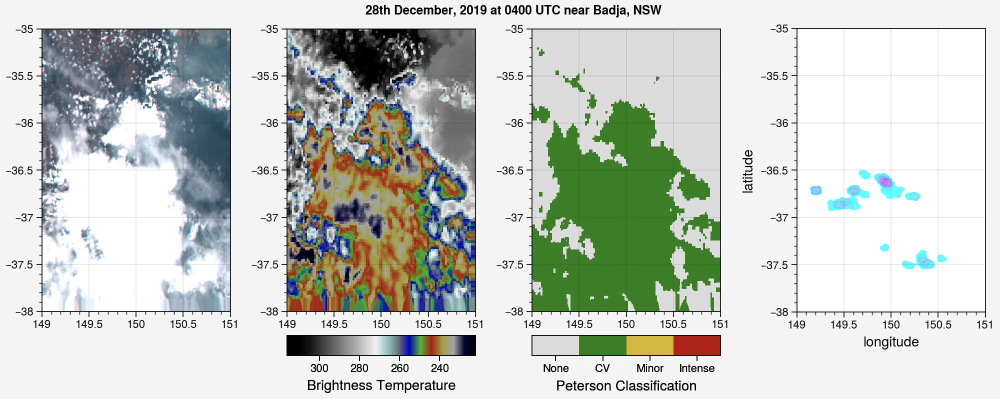

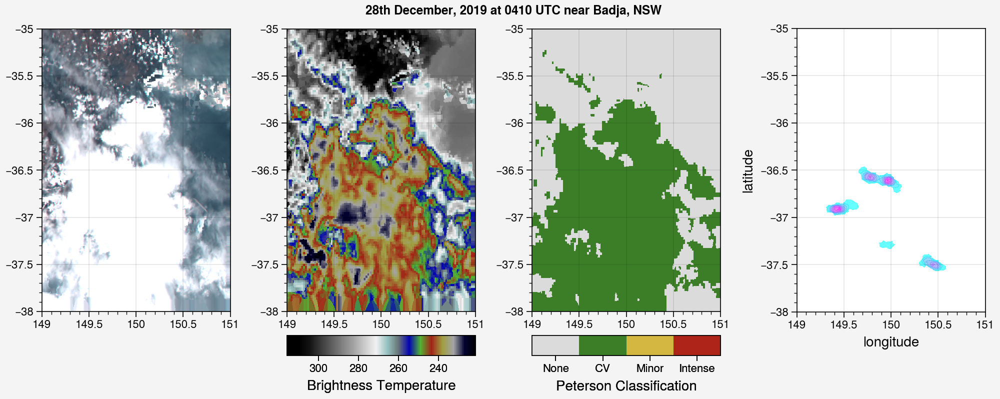

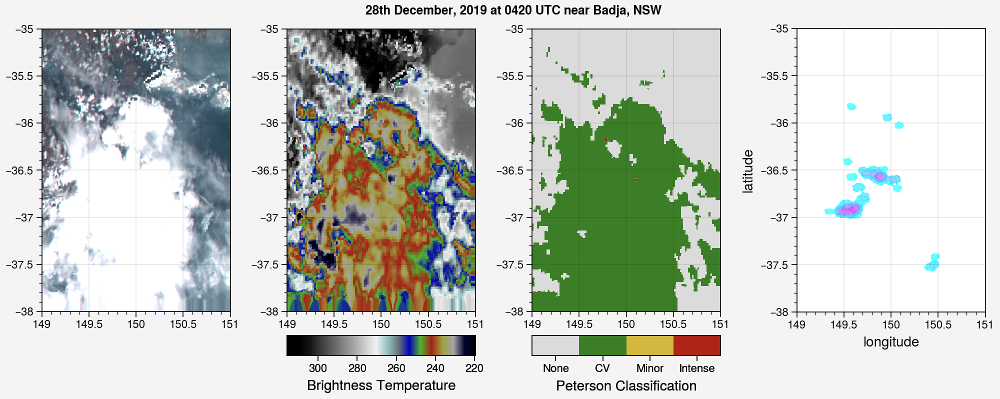

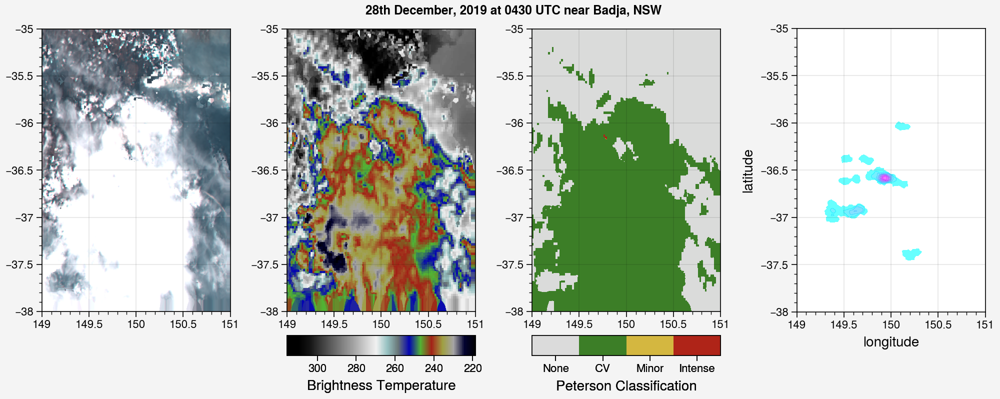

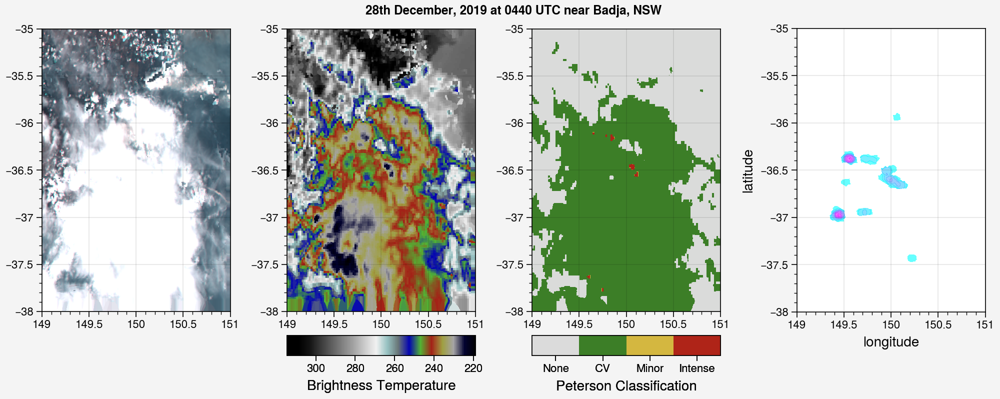

...

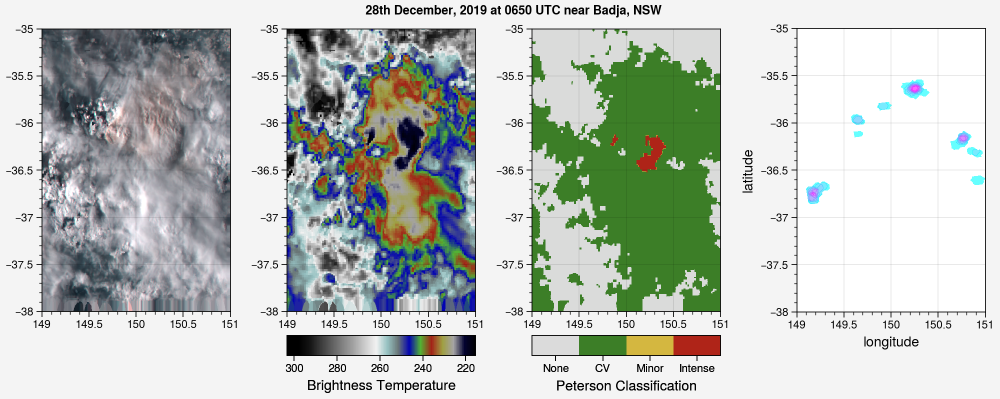

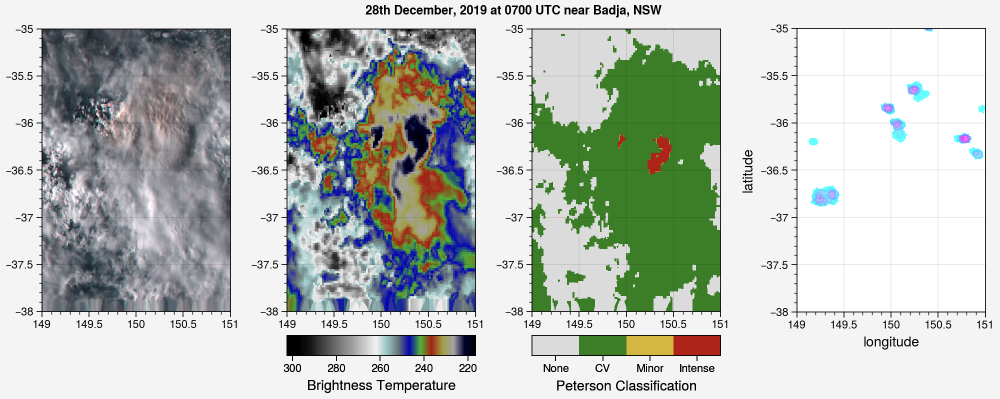

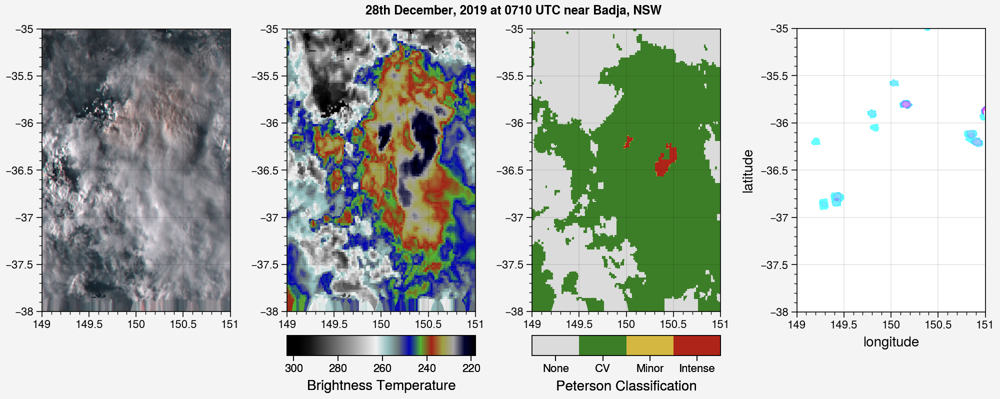

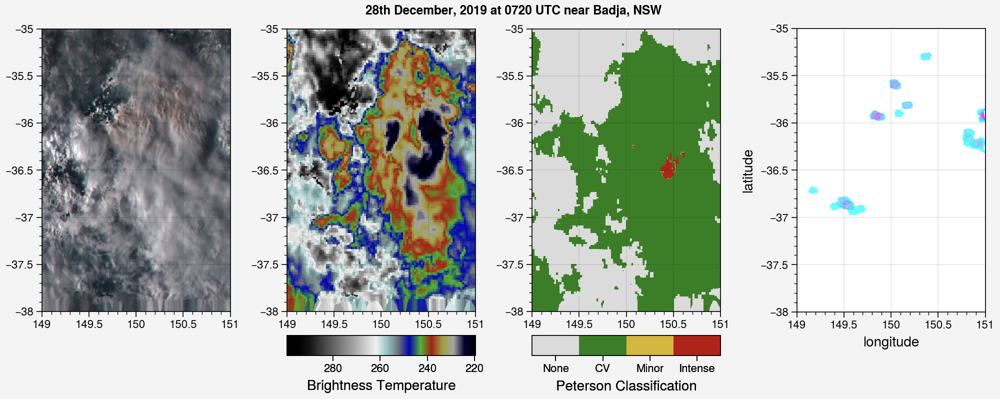

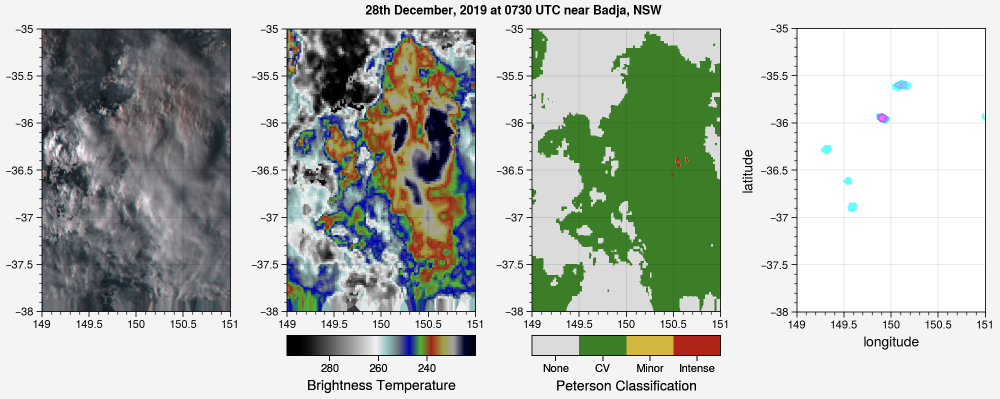

In [27]:
times = ['0400','0410','0420','0430','0440','0450','0500','0510','0520','0530','0540','0550','0600','0610','0620','0630','0640','0650','0700','0710','0720','0730']
## Loop through the following code for each time in the above code.
for i in range(len(times)):
    year = 2019
    month = 12
    day = 28
    time = times[i]
    ## Gets the high-resolution image for the corresponding area.
    rgb, x, y = getHighResCroppedVisible(year, month, day, time, -38, -35, 149, 151)
    ## Gets brightness temperature for corresponding area.
    bt13, nx, ny = getBT(year, month, day, time, -38, -35, 149, 151)
    ## Opens the dataset containing the copernicus data.
    lcl_ds = xarray.open_dataset('data/data_lcl_nsw_black_summer.nc')
    ## Gets the peterson dataset.
    peterson = getUpGridPetersonArray(year, month, day, time, radar_fp, lcl_ds, -38, -35, 149, 151)
    ## Gets the lightning dataset.
    lightning_ds = getLightningData(year, month, day, time, -38, -35, 149, 151)
    ltng = np.where(lightning_ds.lightning_density > 0, lightning_ds.lightning_density, np.nan)
    kw = dict(cmap='gray')
    ## Makes a 4-panel figure of the datasets collected.
    labels = list(("None", "CV", "Minor", "Intense"))
    fig, axs = pplt.subplots(ncols=4, nrows=1, width=10, suptitle="28th December, 2019 at {time} UTC near Badja, NSW".format(time=time), sharex = False, sharey = False)
    axs[0].imshow(rgb, extent=[149, 151, -38, -35])
    axs[0].format(xminorlocator=0.1, xlocator=0.5, yminorlocator=0.1, ylocator=0.5)
    m = axs[1].imshow(bt13, cmap=md.get_zehr_colormap(), extent=[149, 151, -38, -35])
    axs[1].colorbar(m, loc='b', label='Brightness Temperature', reverse=True)
    axs[1].format(xminorlocator=0.1, xlocator=0.5, yminorlocator=0.1, ylocator=0.5)
    n = axs[2].imshow(peterson, cmap=md.get_peterson_palette(), vmin=0.5, vmax=4, discrete=True, N=5, extent=[149, 151, -38, -35])
    axs[2].colorbar(n, loc='b', ticks=np.arange(0.8, 4.1, 0.8) + 0.4, ticklabels=labels, label="Peterson Classification")
    axs[2].format(xminorlocator=0.1, xlocator=0.5, yminorlocator=0.1, ylocator=0.5)
    axs[3].contourf(lightning_ds.longitude, lightning_ds.latitude, ltng, vmax = 1.1*np.nanmax(ltng), ymin=-37, ymax= -35,
                     cmap = 'cool', alpha = 0.6)
    axs[3].format(xlim=(149, 151), ylim=(-38, -35))
    axs[3].format(xminorlocator=0.1, xlocator=0.5, yminorlocator=0.1, ylocator=0.5)
    fig.save('figures/20191228/20191228{time}_40.png'.format(time=time))
frames = []
hour = 3
minutes = 60
with imageio.get_writer('figures/20191228_40.gif', mode='I', duration=10, loop=5) as writer:
    for i in range(len(times)):
        if (minutes == 60):
            hour += 1
            image = imageio.imread('figures/20191228/201912280%d00_40.png' % hour)
            minutes = 10
            writer.append_data(image)
        else:
            image = imageio.imread('figures/20191228/201912280{hour}{minutes}_40.png'.format(hour=hour, minutes=minutes))
            minutes += 10
            writer.append_data(image)
frame_one = frames[0]
frame_one.save("figures/20191228_40.gif", format="GIF", append_images=frames[1:], optimize=False, save_all=True, duration=1000, loop=0)

In [30]:
hour = 3
minutes = 60
## Makes a gif from the individual frames created above.
with imageio.get_writer('figures/20191228_40.gif', mode='I', duration=10, loop=5) as writer:
    for i in range(len(times)):
        if (minutes == 60):
            hour += 1
            image = imageio.imread('figures/20191228/201912280%d00_40.png' % hour)
            minutes = 10
            writer.append_data(image)
        else:
            image = imageio.imread('figures/20191228/201912280{hour}{minutes}_40.png'.format(hour=hour, minutes=minutes))
            minutes += 10
            writer.append_data(image)